In [1]:
import pandas as pd
import numpy as np
import re
import bs4 as bs

# download NLTK classifiers - these are cached locally on your machine
import nltk
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('punkt')

# import ml classifiers
from nltk.tokenize import sent_tokenize # tokenizes sentences
from nltk.stem import PorterStemmer     # parsing/stemmer
from nltk.tag import pos_tag            # parts-of-speech tagging
from nltk.corpus import wordnet         # sentiment scores
from nltk.stem import WordNetLemmatizer # stem and context
from nltk.corpus import stopwords       # stopwords
from nltk.util import ngrams            # ngram iterator
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk import tokenize as tok

# import word2vec
import gensim
from gensim.test.utils import datapath
from gensim import utils
from gensim.models import Word2Vec
from gensim import corpora, models, similarities, downloader

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA
from textblob import TextBlob
import string

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/sixumeng/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/sixumeng/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sixumeng/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/sixumeng/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [2]:
def conditions(s):
    if (s["Customer_Rating"] >=4):return "positive"
    elif (s["Customer_Rating"] <=2):return "negative"
    else:return "neutral"

In [3]:
ps = PorterStemmer()
wnl = WordNetLemmatizer()
eng_stopwords = set(stopwords.words("english"))

alphabet_string = string.ascii_lowercase

for e in ["volvo","car","xc","vehicle","bmw","audi"]+list(alphabet_string):
    eng_stopwords.add(e)

def review_cleaner(review, lemmatize=True, stem=False):
    if lemmatize == True and stem == True:
        raise RuntimeError("May not pass both lemmatize and stem flags")

    #1. Remove HTML tags
    review = bs.BeautifulSoup(review).text    

    #2. Use regex to find emoticons
    emoticons = re.findall('(?::|;|=)(?:-)?(?:\)|\(|D|P)', review)

    #3. Remove punctuation
    review = re.sub("[^a-zA-Z]", " ",review)

    #4. Tokenize into words (all lower case)
    review = review.lower().split()

    #5. Remove stopwords, Lemmatize, Stem
    clean_review=[]
    for word in review:
        if word not in eng_stopwords:
            if lemmatize is True:
                word=wnl.lemmatize(word)
            elif stem is True:
                if word == 'oed':
                    continue
                word=ps.stem(word)
            clean_review.append(word)
            

    #6. Join the review to one sentence
    review_processed = ' '.join(clean_review)
    
    return review_processed

In [4]:
df = pd.read_csv("data/Volvo_edmunds_10yrs.csv",lineterminator='\n').iloc[:,1:]
df['Review_Date'] = pd.to_datetime(df['Review_Date'],errors='coerce')
df["sentiment"] = df.apply(conditions, axis=1)
df["Review"] = df["Review"].apply(review_cleaner)

In [8]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import nlplot
from plotly.subplots import make_subplots
import plotly.express as px

import warnings
warnings.filterwarnings('ignore')

# pd.set_option('display.max_columns', 300)
# pd.set_option('display.max_rows', 300)
# pd.options.display.float_format = '{:.3f}'.format
# pd.set_option('display.max_colwidth', 5000)

In [9]:
df_plot = df.groupby('sentiment').size().reset_index(name='count')
fig = px.bar(df_plot, y='count', x='sentiment', text='count')
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(
    title=str('sentiment counts'),
    xaxis_title=str('sentiment'),
    width=700,
    height=500,
    )
fig.show()

Create instances with all data and positive/neutral/negative

In [13]:
# initialize
npt = nlplot.NLPlot(df, target_col='Review')
npt_negative = nlplot.NLPlot(df.query('sentiment == "negative"'), target_col='Review')
npt_neutral = nlplot.NLPlot(df.query('sentiment == "neutral"'), target_col='Review')
npt_positive = nlplot.NLPlot(df.query('sentiment == "positive"'), target_col='Review')

Stopword calculations can be performed.

In [14]:
stopwords = npt.get_stopword(top_n=30, min_freq=0)
print(stopwords)

['still', 'like', 'safety', 'month', 'driving', 'mile', 'well', 'new', 'issue', 'first', 'feel', 'really', 'love', 'one', 'system', 'road', 'get', 'comfortable', 'would', 'much', 'engine', 'time', 'back', 'drive', 'seat', 'also', 'feature', 'good', 'year', 'great']


### N-gram bar chart

In [16]:
# uni-gram
npt.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

100%|██████████| 1079/1079 [00:00<00:00, 16625.84it/s]


In [17]:
# bi-gram
npt.bar_ngram(
    title='bi-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

100%|██████████| 1079/1079 [00:00<00:00, 11247.58it/s]


In [18]:
# tri-gram
npt.bar_ngram(
    title='tri-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=3,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

100%|██████████| 1079/1079 [00:00<00:00, 14425.68it/s]


## Comparison of each sentiment¶


In [19]:
# positive/neutral/negative
fig_unigram_positive = npt_positive.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

fig_unigram_neutral = npt_neutral.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

fig_unigram_negative = npt_negative.bar_ngram(
    title='uni-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=1,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)


100%|██████████| 155/155 [00:00<00:00, 8872.90it/s]


In [20]:
# subplot
trace1 = fig_unigram_positive['data'][0]
trace2 = fig_unigram_neutral['data'][0]
trace3 = fig_unigram_negative['data'][0]

fig = make_subplots(rows=1, cols=3, subplot_titles=('positive', 'neutral', 'negative'), shared_xaxes=False)
fig.update_xaxes(title_text='word count', row=1, col=1)
fig.update_xaxes(title_text='word count', row=1, col=2)
fig.update_xaxes(title_text='word count', row=1, col=3)

fig.update_layout(height=1100, width=1000, title_text='unigram positive vs neutral vs negative')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)
fig.add_trace(trace3, row=1, col=3)

fig.show()

In [21]:
# positive/neutral/negative
fig_bigram_positive = npt_positive.bar_ngram(
    title='bi-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

fig_bigram_neutral = npt_neutral.bar_ngram(
    title='bi-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

fig_bigram_negative = npt_negative.bar_ngram(
    title='bi-gram',
    xaxis_label='word_count',
    yaxis_label='word',
    ngram=2,
    top_n=50,
    width=800,
    height=1100,
    stopwords=stopwords,
)

100%|██████████| 155/155 [00:00<00:00, 8005.78it/s]


In [22]:
# subplot
trace1 = fig_bigram_positive['data'][0]
trace2 = fig_bigram_neutral['data'][0]
trace3 = fig_bigram_negative['data'][0]

fig = make_subplots(rows=1, cols=3, subplot_titles=('positive', 'neutral', 'negative'), shared_xaxes=False)
fig.update_xaxes(title_text='word count', row=1, col=1)
fig.update_xaxes(title_text='word count', row=1, col=2)
fig.update_xaxes(title_text='word count', row=1, col=3)

fig.update_layout(height=1100, width=1000, title_text='bigram positive vs neutral vs negative')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=1, col=2)
fig.add_trace(trace3, row=1, col=3)

fig.show()

### Tree Map

In [24]:
npt.treemap(
    title='All sentiment Tree of Most Common Words',
    ngram=1,
    stopwords=stopwords,
)

100%|██████████| 1079/1079 [00:00<00:00, 16878.90it/s]


In [25]:
npt_positive.treemap(
    title='Positive Tree of Most Common Words',
    ngram=1,
    stopwords=stopwords,
)

100%|██████████| 810/810 [00:00<00:00, 16593.66it/s]


In [26]:
npt_neutral.treemap(
    title='Neutral Tree of Most Common Words',
    ngram=1,
    stopwords=stopwords,
)

100%|██████████| 114/114 [00:00<00:00, 12246.46it/s]


In [27]:
npt_negative.treemap(
    title='Negative Tree of Most Common Words',
    ngram=1,
    stopwords=stopwords,
)

100%|██████████| 155/155 [00:00<00:00, 12141.28it/s]


### Histogram of the word count

In [28]:
npt.word_distribution(
    title='number of words distribution'
)

positive/neutral/negative

In [30]:
fig_wd_positive = npt_positive.word_distribution()
fig_wd_neutral = npt_neutral.word_distribution()
fig_wd_negative = npt_negative.word_distribution()

In [31]:
trace1 = fig_wd_positive['data'][0]
trace2 = fig_wd_neutral['data'][0]
trace3 = fig_wd_negative['data'][0]

fig = make_subplots(rows=3, cols=1, subplot_titles=('positive', 'neutral', 'negative'), shared_xaxes=True)

fig.update_layout(height=1200, width=900, title_text='words distribution positive vs neutral vs negative')
fig.add_trace(trace1, row=1, col=1)
fig.add_trace(trace2, row=2, col=1)
fig.add_trace(trace3, row=3, col=1)

fig.show()

## Word cloud

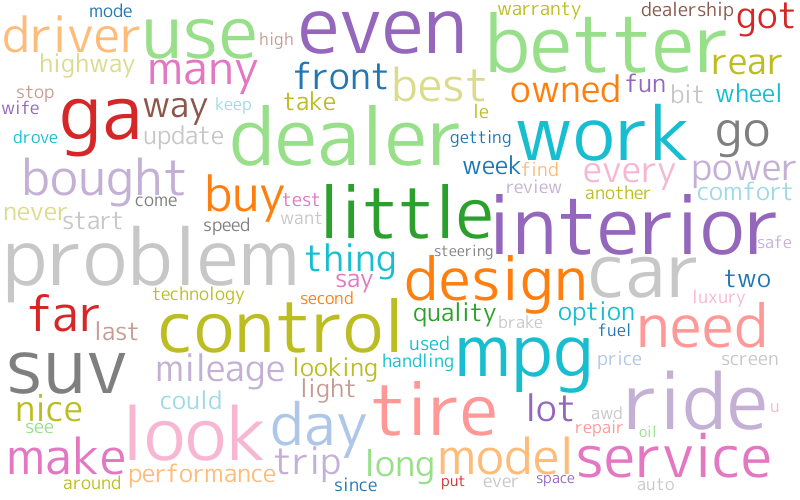

In [33]:
# All sentiment
npt.wordcloud(
    stopwords=stopwords,
    colormap='tab20_r',
)

In [34]:
## positive/neutral/negative


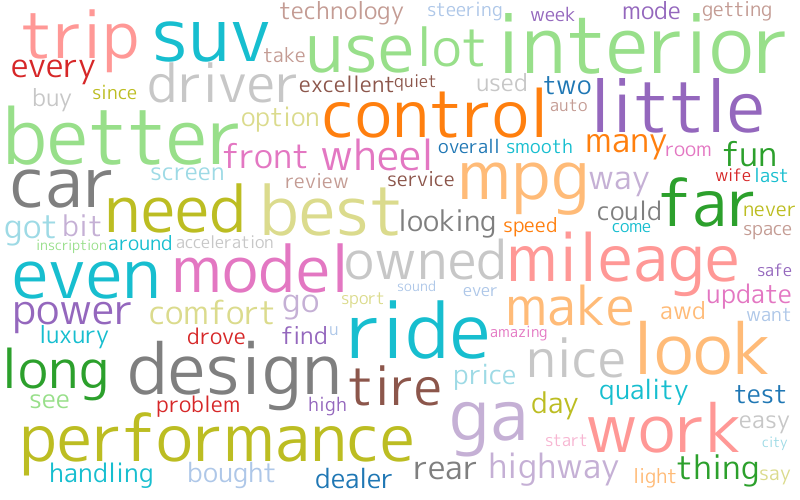

In [35]:
# positive
npt_positive.wordcloud(
    stopwords=stopwords,
    colormap='tab20_r',
)

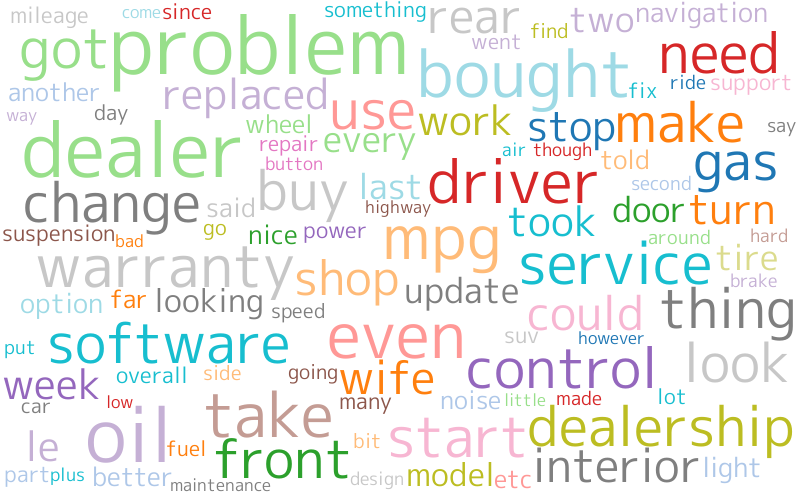

In [36]:
# neutral
npt_neutral.wordcloud(
    stopwords=stopwords,
    colormap='tab20_r',
)

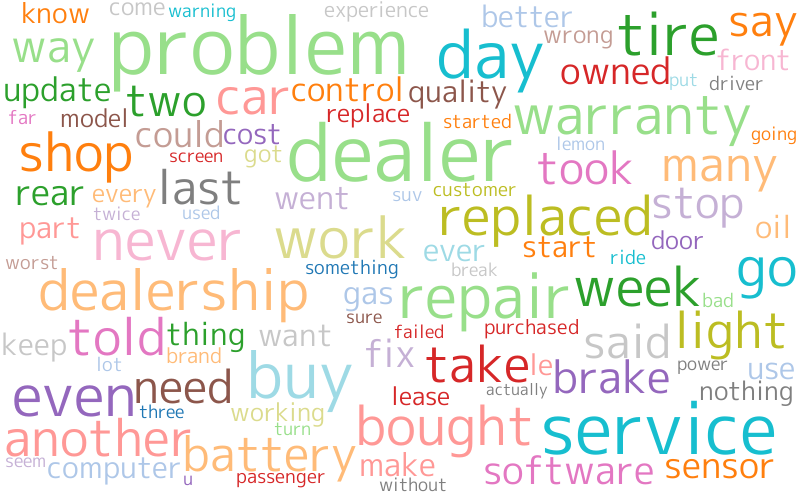

In [37]:
# negative
npt_negative.wordcloud(
    stopwords=stopwords,
    colormap='tab20_r',
)

In [38]:
# Co-occurrence network

In [39]:
npt.build_graph(stopwords=stopwords, min_edge_frequency=25)
npt_positive.build_graph(stopwords=stopwords, min_edge_frequency=10)
npt_neutral.build_graph(stopwords=stopwords, min_edge_frequency=10)
npt_negative.build_graph(stopwords=stopwords, min_edge_frequency=10)

node_size:187, edge_size:2036
node_size:483, edge_size:12047
node_size:10, edge_size:11
node_size:61, edge_size:160


In [40]:
# graph data
display(
    npt.node_df.head(),
    npt.edge_df.head(),
)

,id,id_code,adjacency_frequency,betweeness_centrality,clustering_coefficient,community
0,city,0,11,0.000002,0.981818,0
1,around,1,22,0.000068,0.939394,3
2,say,2,31,0.000180,0.892473,0
3,repair,3,1,0.000000,0.000000,1
4,find,4,28,0.000287,0.851852,1


,source,target,edge_frequency,source_code,target_code
0,gas,mileage,108,96,180
1,dealer,problem,67,108,160
2,long,trip,61,7,35
3,design,interior,60,90,110
4,highway,mpg,58,66,169


In [41]:
# all data
npt.co_network(
    title='All sentiment Co-occurrence network',
    color_palette='hls',
    width=1000,
    height=1200,
)

In [42]:
## positive/neutral/negative


In [43]:
npt_positive.co_network(
    title='Positive Co-occurrence network',
    color_palette='hls',
    width=1000,
    height=1200,
)

In [44]:
npt.ldavis(num_topics=3, passes=5, save=False)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.022670  0.031320       1        1  53.695010
0     -0.017509 -0.034121       2        1  28.671745
2      0.040179  0.002802       3        1  17.633245, topic_info=       Term        Freq       Total Category  logprob  loglift
44    still  259.000000  259.000000  Default  30.0000  30.0000
247    mile  422.000000  422.000000  Default  29.0000  29.0000
156    time  413.000000  413.000000  Default  28.0000  28.0000
317   issue  308.000000  308.000000  Default  27.0000  27.0000
23      get  448.000000  448.000000  Default  26.0000  26.0000
..      ...         ...         ...      ...      ...      ...
12    drive   55.710583  541.749410   Topic3  -5.4996  -0.5392
124   would   46.185387  365.102929   Topic3  -5.6871  -0.3321
81     seat   49.368472  571.720499   Topic3  -5.6205  -0.7140
974  system   44.731887  362.935673   Topic3  -5.7191  -0.3582
19     feel   42.254983  260.307967   Topic3  -5.7761  -0.0828

[297 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
199       1  0.578036     also
199       2  0.273182     also
199       3  0.150448     also
94        1  0.867515  amazing
94        2  0.058616  amazing
...     ...       ...      ...
124       2  0.416321    would
124       3  0.125992    would
332       1  0.472086     year
332       2  0.335645     year
332       3  0.193746     year

[491 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 1, 3])